In [ ]:
# ------ STEP 1 ------------
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json
!kaggle datasets download -d winchester19/indian-music-genre-dataset

 96% 297M/309M [00:02<00:00, 150MB/s]
100% 309M/309M [00:02<00:00, 135MB/s]


In [ ]:
!unzip /content/indian-music-genre-dataset.zip -d dataSet

Archive:  /content/indian-music-genre-dataset.zip
  inflating: dataSet/genrenew/bollypop/bp01.mp3  
  inflating: dataSet/genrenew/bollypop/bp02.mp3  
  inflating: dataSet/genrenew/bollypop/bp03.mp3  
  inflating: dataSet/genrenew/bollypop/bp04.mp3  
  inflating: dataSet/genrenew/bollypop/bp05.mp3  
  inflating: dataSet/genrenew/bollypop/bp06.mp3  
  inflating: dataSet/genrenew/bollypop/bp07.mp3  
  inflating: dataSet/genrenew/bollypop/bp08.mp3  
  inflating: dataSet/genrenew/bollypop/bp09.mp3  
  inflating: dataSet/genrenew/bollypop/bp10.mp3  
  inflating: dataSet/genrenew/bollypop/bp100.mp3  
  inflating: dataSet/genrenew/bollypop/bp11.mp3  
  inflating: dataSet/genrenew/bollypop/bp12.mp3  
  inflating: dataSet/genrenew/bollypop/bp13.mp3  
  inflating: dataSet/genrenew/bollypop/bp14.mp3  
  inflating: dataSet/genrenew/bollypop/bp15.mp3  
  inflating: dataSet/genrenew/bollypop/bp16.mp3  
  inflating: dataSet/genrenew/bollypop/bp17.mp3  
  inflating: dataSet/genrenew/bollypop/bp18.mp3  

In [ ]:
# ------ STEP 2 ------------
!pip install librosa==0.9.1

     |████████████████████████████████| 213 kB 5.3 MB/s 
  Attempting uninstall: librosa
    Found existing installation: librosa 0.8.1
    Uninstalling librosa-0.8.1:
      Successfully uninstalled librosa-0.8.1


In [ ]:
# ------ STEP 3  ------------
import warnings
warnings.filterwarnings('ignore')

%tensorflow_version 2.x
%reload_ext tensorboard

import os
import json
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import keras
import sklearn
import IPython
from sklearn.model_selection import train_test_split
import librosa
import librosa.display

In [ ]:
# ------ STEP 4 ------------
DATASET_DIR = "./dataSet/genrenew/"
buckets = ['bollypop', 'carnatic', 'sufi', 'semiclassical', 'ghazal']
buckets

['bollypop', 'carnatic', 'sufi', 'semiclassical', 'ghazal']

In [ ]:
x_files = []
labels = []
for bucket in buckets:
    filepath = DATASET_DIR + bucket
    files = os.listdir(filepath)
    x_files.extend([filepath + '/' + file for file in files])
    labels.extend([bucket] * len(files))

len(x_files), len(labels)

(500, 500)

In [ ]:
x_files[101], labels[101]

('./dataSet/genrenew/carnatic/ca31.mp3', 'carnatic')

In [ ]:
IPython.display.Audio(x_files[0])

# Data Exploration

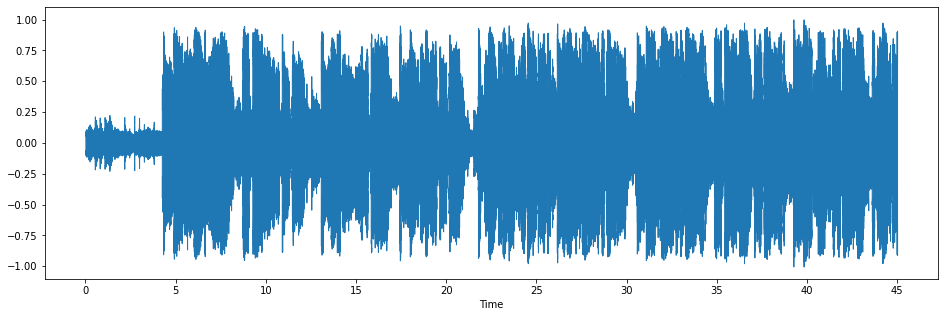

In [ ]:
# Visualizing Audio File as a waveform
sample, sr = librosa.load(x_files[0])
plt.figure(figsize=(16, 5))
librosa.display.waveshow(sample, sr=sr) 

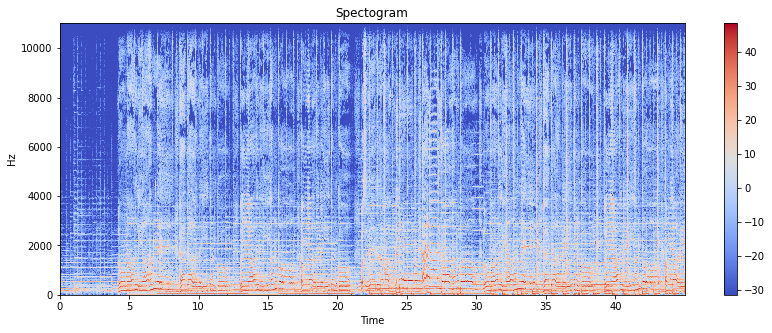

In [ ]:
# Visualizing audio file as a spectogram
sample_stft = librosa.stft(sample)
sample_db = librosa.amplitude_to_db(abs(sample_stft))
plt.figure(figsize=(14, 5))
librosa.display.specshow(sample_db, sr=sr, x_axis='time', y_axis='hz')
plt.title('Spectogram')
plt.colorbar()

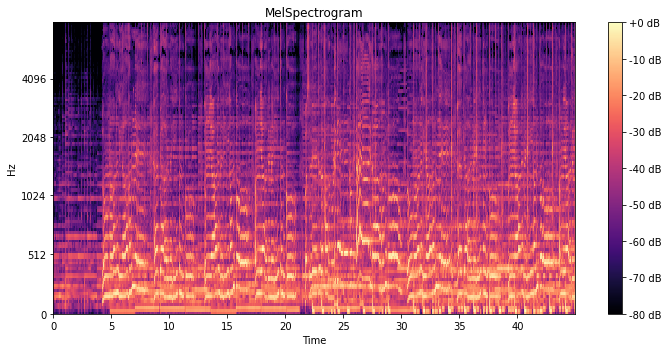

In [ ]:
# Visualizing Audio as Mel-Spectogram
sample, sr = librosa.load(x_files[0])
melSpec = librosa.feature.melspectrogram(y=sample, sr=sr, n_mels=128)
melSpec_db = librosa.power_to_db(melSpec, ref=np.max)
plt.figure(figsize=(10, 5))
librosa.display.specshow(melSpec_db, x_axis='time', y_axis='mel', sr=sr, fmax=8000)
plt.colorbar(format='%+1.0f dB')
plt.title("MelSpectrogram")
plt.tight_layout()
plt.show()

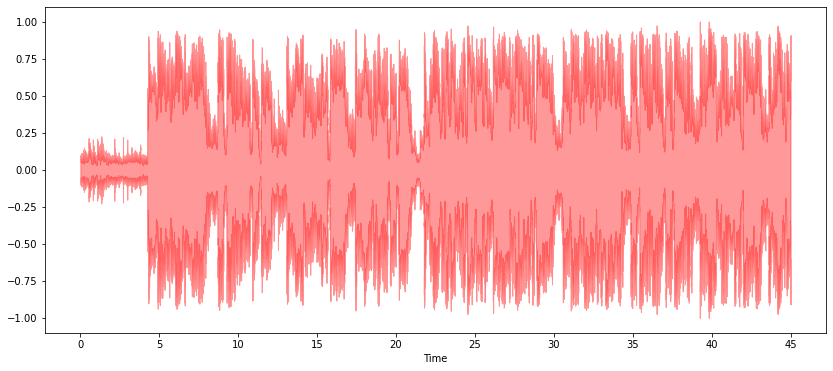

In [ ]:
data, sr = librosa.load(x_files[0])
# specifies the percentage of the total spectral energy
spectral_rolloff = librosa.feature.spectral_rolloff(data+0.01, sr=sr)[0]
plt.figure(figsize=(14, 6))
librosa.display.waveshow(data, sr=sr, alpha=0.4, color="#ff0000");

# Data Preprocessing

In [ ]:
# shape selected: (40, 1938)
X = [] # features
y = [] # labels
for f, label in zip(x_files, labels):
    clip, sr = librosa.load(f)
    mfcc = librosa.feature.mfcc(y=clip, sr=sr, n_mfcc=40)
    if(mfcc.shape[1] >= 1938):
        # chops all columns from the numpy array after 1938
        mfcc = np.delete(mfcc, np.s_[1938:], axis=1) # clip the audio
        X.extend(list(np.hsplit(mfcc, 3))) # split the audio into 3 on its horizontal axis
        y.extend([buckets.index(label)] * 3)

X = np.array(X)
y = np.array(y)

In [ ]:
# compressed binary file
np.savez_compressed("./drive/MyDrive/genre_classification/genre_data", features=X, labels=y)

In [ ]:
X.shape, y.shape

((1491, 40, 646), (1491,))

In [ ]:
X = np.expand_dims(X, axis = 3)
encoder = sklearn.preprocessing.OneHotEncoder()
y = encoder.fit_transform(np.expand_dims(y, axis = 1)).toarray()
X.shape, y.shape

((1491, 40, 646, 1), (1491, 5))

In [ ]:
np.savez_compressed("./drive/MyDrive/genre_classification/genre_data", features=X, labels=y)

In [ ]:
X_train, X_test, y_train, y_test = sklearn.model_selection.train_test_split(X, y, test_size=0.2)
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((1192, 40, 646, 1), (299, 40, 646, 1), (1192, 5), (299, 5))

In [ ]:
np.savez_compressed("./drive/MyDrive/genre_classification/genre_split_data", X_train=X_train, X_test=X_test, y_train=y_train, y_test=y_test)

## Start from here if extracted features and labels saved in drive

In [ ]:
# ------ STEP 5 ------------
data = np.load("./drive/MyDrive/genre_classification/genre_split_data.npz")
X_train, y_train, X_test, y_test = data["X_train"], data["y_train"], data["X_test"], data["y_test"]
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((1192, 40, 646, 1), (299, 40, 646, 1), (1192, 5), (299, 5))

### Machine Learning Algorithms

In [ ]:
# --------- STEP 6 ---------
X_train = np.squeeze(X_train) # (1191, 40, 646) => (1191, 40 * 646)
X_test = np.squeeze(X_test)
X_train = np.reshape(X_train, (-1, X_train.shape[1] * X_train.shape[2]))
X_test = np.reshape(X_test, (-1, X_test.shape[1] * X_test.shape[2]))
X_train.shape, X_test.shape

((1192, 25840), (299, 25840))

In [ ]:
knn = sklearn.neighbors.KNeighborsClassifier(n_neighbors=len(buckets)) # KNN
knn.fit(X_train, y_train)

KNeighborsClassifier()

In [ ]:
accuracy = knn.score(X_test, y_test)
print(f'{accuracy * 100}%');

0.5652173913043478

In [ ]:
import sklearn.ensemble
from sklearn.model_selection import RandomizedSearchCV

# Setup the parameters grid
grid = {"n_estimators": [10, 100, 200, 500, 1000, 1200],
        "max_depth": [None, 5, 10, 20, 30],
        "max_features": ["auto", "sqrt"],
        "min_samples_split": [2, 4, 6],
        "min_samples_leaf": [1, 2, 4]}

clf = sklearn.ensemble.RandomForestClassifier(n_jobs=1)

rs_clf = RandomizedSearchCV(estimator=clf,
                            param_distributions=grid, 
                            n_iter=10, # number of models to try
                            cv=5,
                            verbose=2,
                            random_state=42, # set random_state to 42 for reproducibility
                            refit=True) # set refit=True (default) to refit the best model on the full dataset 

# Fit the RandomizedSearchCV version of clf
rs_clf.fit(X_train, y_train) # 'rs' is short for RandomizedSearch

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=6, n_estimators=100; total time=  12.0s
[CV] END max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=6, n_estimators=100; total time=  12.2s
[CV] END max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=6, n_estimators=100; total time=  13.2s
[CV] END max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=6, n_estimators=100; total time=  12.7s
[CV] END max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=6, n_estimators=100; total time=  12.1s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=  12.4s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=  12.3s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimato

RandomizedSearchCV(cv=5, estimator=RandomForestClassifier(n_jobs=1),
                   param_distributions={'max_depth': [None, 5, 10, 20, 30],
                                        'max_features': ['auto', 'sqrt'],
                                        'min_samples_leaf': [1, 2, 4],
                                        'min_samples_split': [2, 4, 6],
                                        'n_estimators': [10, 100, 200, 500,
                                                         1000, 1200]},
                   random_state=42, verbose=2)

In [ ]:
# Check best parameters of RandomizedSearchCV
rs_clf.best_params_

{'max_depth': 20,
 'max_features': 'auto',
 'min_samples_leaf': 2,
 'min_samples_split': 2,
 'n_estimators': 10}

In [ ]:
# Evaluate RandomizedSearch model
accuracy = rs_clf.score(X_test, y_test)
accuracy

0.25418060200668896

A C D
B D D
E F A

In [ ]:
model = tf.keras.models.Sequential([
    tf.keras.layers.Conv2D(32, (3, 3), padding = "same", activation = "relu", input_shape = (40, 646, 1)),
    tf.keras.layers.MaxPool2D((2, 2)),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Conv2D(64, (3, 3), padding = "same", activation = "relu"), # Second convolutional layer
    tf.keras.layers.Conv2D(64, (3, 3), padding = "same", activation = "relu"), # Third convolutional layer
    tf.keras.layers.MaxPool2D((2, 2)),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Conv2D(128, (3, 3), padding = "same", activation = "relu"),# Fourth convolutional layer
    tf.keras.layers.MaxPool2D((2, 2)),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(64, activation = "relu"),# Hidden layer
    tf.keras.layers.Dropout(0.3),
    tf.keras.layers.Dense(len(buckets), activation = "softmax")# Output layer
])
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 40, 646, 32)       320       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 20, 323, 32)      0         
 )                                                               
                                                                 
 batch_normalization (BatchN  (None, 20, 323, 32)      128       
 ormalization)                                                   
                                                                 
 conv2d_1 (Conv2D)           (None, 20, 323, 64)       18496     
                                                                 
 conv2d_2 (Conv2D)           (None, 20, 323, 64)       36928     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 10, 161, 64)      0

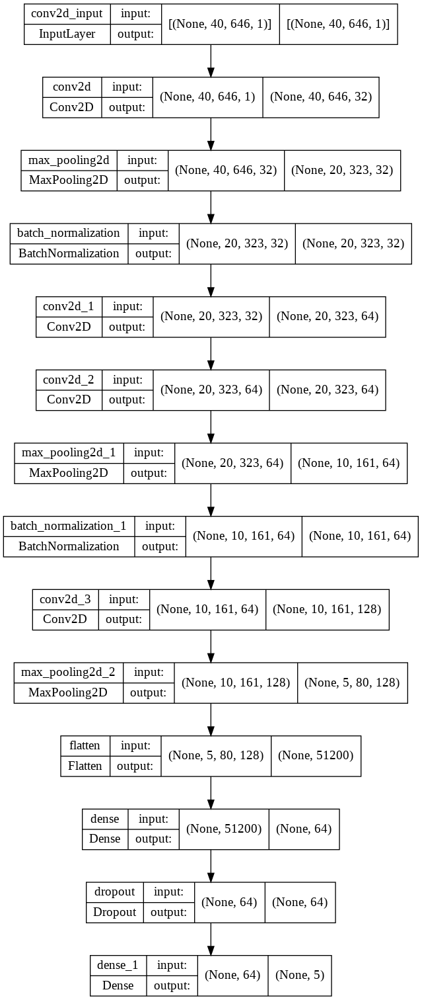

In [ ]:
keras.utils.vis_utils.plot_model(model, to_file='./drive/MyDrive/genre_classification/genre-classification-model-architecture.png', show_shapes=True, show_layer_names=True)

In [ ]:
model.compile(optimizer = "rmsprop",
              loss = "categorical_crossentropy",
              metrics = ["accuracy"])

In [ ]:
# Reducing learning rate when the model takes a flat road during training
# final logs path "./drive/MyDrive/genre_classification/logs/second"
# final model path "./drive/MyDrive/genre_classification/models/best_model_100_retry.hdf5"
reduce_lr = tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss',
                            factor=0.2, # 0.0003
                            patience=5,
                            min_lr=0.0001,
                            verbose = 1,
                            mode = "min")

tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir="./drive/MyDrive/genre_classification/logs/second")
checkpoint_callback = tf.keras.callbacks.ModelCheckpoint("./drive/MyDrive/genre_classification/models/best_model_100_retry.hdf5",
                                                         monitor='val_loss',
                                                         mode='min',
                                                         save_best_only=True,
                                                         save_weights_only=True)

constants = {
    "INPUT_SHAPE" : (40, 646, 1),
    "BATCH_SIZE" : 64,
    "EPOCHS" : 100,
}

In [ ]:
# ------ STEP 8 ------------
history = model.fit(
    X_train, y_train,
    epochs = constants["EPOCHS"],
    validation_data = (X_test, y_test),
    callbacks = [reduce_lr, tensorboard_callback, checkpoint_callback]
)

Epoch 1/100
38/38 [==============================] - 5s 108ms/step - loss: 6.1614 - accuracy: 0.3096 - val_loss: 9.5836 - val_accuracy: 0.2809 - lr: 0.0010
Epoch 2/100
38/38 [==============================] - 4s 98ms/step - loss: 1.6374 - accuracy: 0.2567 - val_loss: 1.5995 - val_accuracy: 0.2140 - lr: 0.0010
Epoch 3/100
38/38 [==============================] - 4s 96ms/step - loss: 1.6097 - accuracy: 0.2005 - val_loss: 1.6097 - val_accuracy: 0.1940 - lr: 0.0010
Epoch 4/100
38/38 [==============================] - 4s 98ms/step - loss: 1.6097 - accuracy: 0.2005 - val_loss: 1.6098 - val_accuracy: 0.1940 - lr: 0.0010
Epoch 5/100
38/38 [==============================] - 4s 96ms/step - loss: 1.6096 - accuracy: 0.2005 - val_loss: 1.6098 - val_accuracy: 0.1940 - lr: 0.0010
Epoch 6/100
38/38 [==============================] - 4s 95ms/step - loss: 1.6096 - accuracy: 0.2005 - val_loss: 1.6098 - val_accuracy: 0.1940 - lr: 0.0010
Epoch 7/100
37/38 [============================>.] - ETA: 0s - loss: 

In [ ]:
import shutil
shutil.rmtree("/content/drive/MyDrive/genre_classification/logs")
os.mkdir("/content/drive/MyDrive/genre_classification/logs")
# os.mkdir("/content/drive/MyDrive/genre_classification/models")

In [ ]:
%tensorboard --logdir "./drive/MyDrive/genre_classification/logs"

<IPython.core.display.Javascript object>

In [ ]:
model = tf.keras.models.load_model("./drive/MyDrive/genre_classification/models/best_model_100_retry.hdf5")
model.evaluate(X_test, y_test)